The dataset for clustering is quake.csv. It contains information about earthquakes: coordinates, depth and strength. Your task is to cluster the data:

Max: ten points

- Exploratory analysis (there are some specific characteristics of features, which may change the result of the analysis) - 1

- Build K-Means with 15 clusters - 1

- Determine optimal number of clusters for K-Means - 1

- Create visualization for the obtained clusters - 1

- Try another clustering algorithms; tune their hyperparameters to achieve better results. You should use at least two different algorithms - 2

- Use labelled and unlabeled metrics to estimate quality of clusters you built - 2

- Explain the final choice of best clusterizations: give interpretation of clusters.

- Visualize best clusterizations in your opinion on the world map. - 1

## Preprocess

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.model_selection import GridSearchCV

In [ ]:
quake = pd.read_csv('quake.csv')
quake.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2178 entries, 0 to 2177
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Focal depth  2178 non-null   int64  
 1   Latitude     2178 non-null   float64
 2   Longitude    2178 non-null   float64
 3   Richter      2178 non-null   float64
dtypes: float64(3), int64(1)
memory usage: 68.2 KB


In [ ]:
quake.describe()

,Focal depth,Latitude,Longitude,Richter
count,2178.000000,2178.000000,2178.000000,2178.000000
mean,74.359963,7.961997,54.914835,5.977181
std,116.467797,30.545583,118.875581,0.189426
min,0.000000,-66.490000,-179.960000,5.800000
25%,21.000000,-12.432500,-67.782500,5.800000
50%,39.000000,0.210000,122.100000,5.900000
75%,68.000000,36.480000,146.860000,6.100000
max,656.000000,78.150000,180.000000,6.900000


Here should be the description of the features: Focal depth is the depth of earthquake, Latitude and Longitude are coordinates, Richter is the strength. 
- We can build two types of clusters: only coordinates and all features. The choice is left for students.
- Richter has low variance, as a result we may exclude this feature as it does not give a lot of information
- Longitute is measured from -180 up to 180. However, if we look at Earth, -180 and 180 Longitude is the same one. However, their numerical representation makes the distance between them as far as possible. And we can see that a lot of earthquakes are situated at roughly this longitude. As a result, a lot of points will be in different clusters, despite in reality they are close. There are 2 possible solutions:
    - Introduce polar coordinate/distance matrix methods instead of objects
    - Change longitude to be measured from 0 to 360, so the split line goes through 0 longitude, where there are not a lot of earthquakes.

## Possible metrics

Lets use longitude histogram to select area with least quakes and select split line corrdinates to deal with problem of geocoordinates periodicity. Here we can choose area nearby 0 or -130.

(array([270.,  49., 141., 137.,  65.,  49., 106., 177., 571., 613.]),
 array([-1.79960e+02, -1.43964e+02, -1.07968e+02, -7.19720e+01,
        -3.59760e+01,  2.00000e-02,  3.60160e+01,  7.20120e+01,
         1.08008e+02,  1.44004e+02,  1.80000e+02]),
 <a list of 10 Patch objects>)

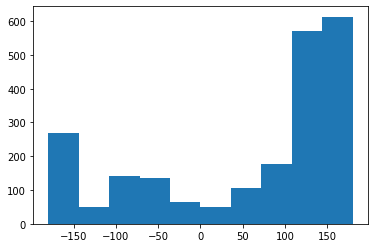

In [ ]:
plt.hist(quake['Longitude'])

In [ ]:
long = quake.loc[:,'Longitude']
long_copy = long.copy()
long_copy[long < 0] += 360
quake['Longitude'] = long_copy
quake_coord = quake[['Latitude', 'Longitude']]
quake_coord.describe()

,Latitude,Longitude
count,2178.000000,2178.000000
mean,7.961997,164.336322
std,30.545583,69.457703
min,-66.490000,1.400000
25%,-12.432500,126.060000
50%,0.210000,151.795000
75%,36.480000,184.010000
max,78.150000,355.110000


We can also change coordinate system in order to make euclidian metric correct. So we can figure out formulas of finding $x, y, z$ on a unit sphere. 

In [ ]:
quake_coord_euclid = quake[['Focal depth', 'Richter']]
quake_coord_euclid['X'] = np.cos(quake['Latitude'] * np.pi / 180) * np.cos(quake['Longitude']* np.pi / 180)
quake_coord_euclid['Y'] = np.cos(quake['Latitude'] * np.pi / 180) * np.sin(quake['Longitude']* np.pi / 180)
quake_coord_euclid['Z'] = np.sin(quake['Latitude'] * np.pi / 180)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
quake_coord_euclid

,Focal depth,Richter,X,Y,Z
0,33,6.7,0.538922,0.290180,-0.790796
1,36,5.8,-0.612287,0.340375,0.713617
2,57,5.8,-0.593173,0.450569,0.667183
3,67,6.2,-0.679890,0.547623,0.487707
4,30,6.0,-0.914731,0.164421,-0.369098
...,...,...,...,...,...
2173,13,5.8,-0.617476,-0.074614,0.783043
2174,97,5.9,-0.930748,0.320300,-0.176398
2175,527,5.8,-0.672307,0.574002,0.467467
2176,51,6.0,-0.625102,0.506559,0.593840


In [ ]:
quake_coord_euclid[['Focal depth']] = StandardScaler().fit_transform(
    quake_coord_euclid[['Focal depth']]
)

In [ ]:
quake_coord_euclid

,Focal depth,Richter,X,Y,Z
0,-0.355201,6.7,0.538922,0.290180,-0.790796
1,-0.329437,5.8,-0.612287,0.340375,0.713617
2,-0.149088,5.8,-0.593173,0.450569,0.667183
3,-0.063208,6.2,-0.679890,0.547623,0.487707
4,-0.380965,6.0,-0.914731,0.164421,-0.369098
...,...,...,...,...,...
2173,-0.526962,5.8,-0.617476,-0.074614,0.783043
2174,0.194433,5.9,-0.930748,0.320300,-0.176398
2175,3.887289,5.8,-0.672307,0.574002,0.467467
2176,-0.200616,6.0,-0.625102,0.506559,0.593840


For this example we will work only with coordinates, work with full features is pretty similar, we only need to correctly scale them. 

In [ ]:
quake_coord = quake_coord_euclid[['X', 'Y', 'Z']]

In [ ]:
quake_coord

,X,Y,Z
0,0.538922,0.290180,-0.790796
1,-0.612287,0.340375,0.713617
2,-0.593173,0.450569,0.667183
3,-0.679890,0.547623,0.487707
4,-0.914731,0.164421,-0.369098
...,...,...,...
2173,-0.617476,-0.074614,0.783043
2174,-0.930748,0.320300,-0.176398
2175,-0.672307,0.574002,0.467467
2176,-0.625102,0.506559,0.593840


Also you can compute metric matrix and pass it to the sklearn models (but not for KMeans in newest versions)

## KMeans

In [ ]:
K = 15

In [ ]:
from sklearn.cluster import KMeans


import folium
from folium.plugins import MarkerCluster

In [ ]:
kmeans = KMeans(K, n_init=20)
kmeans.fit(quake_coord)
clusters = kmeans.labels_

In [ ]:
colors = ["red", "blue", "green", "purple", "orange", "darkred",
          "lightred", "beige", "darkblue", "darkgreen", "cadetblue", "darkpurple", 
          "white", "pink", "lightblue", "lightgreen", "gray", "black", "lightgray"]

In [ ]:
colors = ["red", "blue", "green", "purple", "orange", "darkred",
          "lightred", "beige", "darkblue", "darkgreen", "cadetblue", "darkpurple", 
          "white", "pink", "lightblue", "lightgreen", "gray", "black", "lightgray"]

m = folium.Map(location=[0, 0], zoom_start=1, disable_3d=True, prefer_canvas=True)
"""clusterMarkers = []
for i in range(K):
    clusterMarkers.append(MarkerCluster().add_to(m))"""
for i, row in quake.iterrows():
    if row['Longitude'] > 180:
        coords = [row['Latitude'], row['Longitude']-360]
    else:
        coords = [row['Latitude'], row['Longitude']]
    cluster_id = clusters[i]
    folium.Marker(location=coords, icon=folium.Icon(color=colors[cluster_id])).add_to(m)

m

This is one of the possible map modules to use. Other option could be using Mercator projection as background for the plot with chosen coordinates and plotting points according to simple matplotlib plot.

In [ ]:
silhoette_scores = []

inertia = []
cluster_qualitys = []

for K in range(2, 20):
    kmeans = KMeans(K, n_init=20)
    kmeans.fit(quake_coord)
    labels = kmeans.predict(quake_coord)
    inertia.append(kmeans.inertia_)
    silhoette_scores.append(
        silhouette_score(quake_coord, labels)
    )


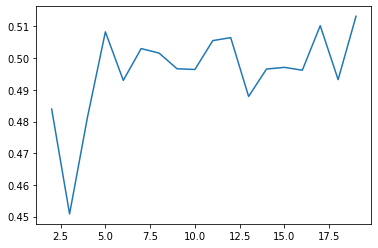

In [ ]:
plt.plot(range(2, 20), silhoette_scores)

In [ ]:
silhoette_optimal = list(range(2, 20))[np.argmax(silhoette_scores)]
silhoette_optimal

19

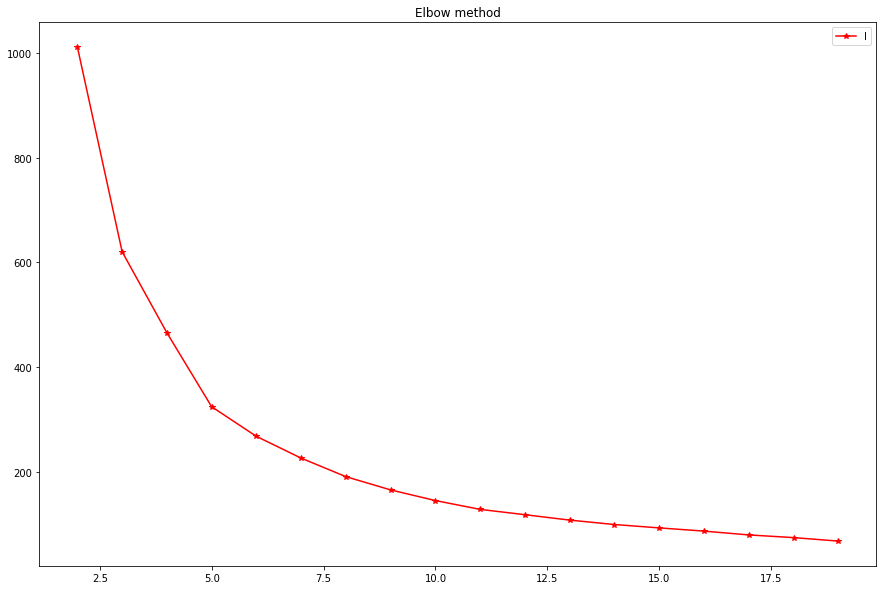

In [ ]:
plt.figure(figsize=(15, 10))
ax = plt.plot(range(2, 20), inertia, '-r*')
plt.legend(ax, 'Inertia')
plt.title('Elbow method')
plt.show()

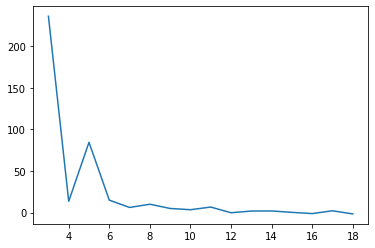

In [ ]:
plt.plot(range(3, 19), np.diff(inertia, n=2))


In [ ]:
elbow_optimal = 5

Vizualization with silhoette optimal number of clusters

In [ ]:
kmeans = KMeans(silhoette_optimal, n_init=20)
kmeans.fit(quake_coord)
silhouette_clusters = kmeans.labels_

colors = ["red", "blue", "green", "purple", "orange", "darkred",
          "lightred", "beige", "darkblue", "darkgreen", "cadetblue", "darkpurple", 
          "white", "pink", "lightblue", "lightgreen", "gray", "black", "lightgray"]

m = folium.Map(location=[0, 0], zoom_start=1, disable_3d=True, prefer_canvas=True)
"""clusterMarkers = []
for i in range(K):
    clusterMarkers.append(MarkerCluster().add_to(m))"""
for i, row in quake.iterrows():
    if row['Longitude'] > 180:
        coords = [row['Latitude'], row['Longitude']-360]
    else:
        coords = [row['Latitude'], row['Longitude']]
    cluster_id = silhouette_clusters[i]
    folium.Marker(location=coords, icon=folium.Icon(color=colors[cluster_id])).add_to(m)

m

In [ ]:
kmeans = KMeans(elbow_optimal, n_init=20)
kmeans.fit(quake_coord)
elbow_kmeans = kmeans.labels_

colors = ["red", "blue", "green", "purple", "orange", "darkred",
          "lightred", "beige", "darkblue", "darkgreen", "cadetblue", "darkpurple", 
          "white", "pink", "lightblue", "lightgreen", "gray", "black", "lightgray"]

m = folium.Map(location=[0, 0], zoom_start=1, disable_3d=True, prefer_canvas=True)
"""clusterMarkers = []
for i in range(K):
    clusterMarkers.append(MarkerCluster().add_to(m))"""
for i, row in quake.iterrows():
    if row['Longitude'] > 180:
        coords = [row['Latitude'], row['Longitude']-360]
    else:
        coords = [row['Latitude'], row['Longitude']]
    cluster_id = elbow_kmeans[i]
    folium.Marker(location=coords, icon=folium.Icon(color=colors[cluster_id])).add_to(m)

m

Here we can compare pair of cluerings: one with optimal number of clusters selected by elbow rule and one with silhouette score criteria. Silhouette score gives us more complex and reasonable clusters, so we will consider them as ground truth labels for other clustering methods.

## Other clusterings

In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score, adjusted_rand_score, mutual_info_score
from sklearn.model_selection import GridSearchCV

In [ ]:
min_samp = 4
silh_list = []
ari_list = []
eps_grid = np.linspace(0.01, 0.1, 100)
for e in eps_grid:
    dbscan = DBSCAN(eps=e, min_samples=min_samp)
    dbscan.fit(quake_coord)
    if len(dbscan.components_) > 0 and len(dbscan.components_) < quake_coord.shape[0]:
        silh_list.append(silhouette_score(quake_coord, dbscan.labels_))
        ari_list.append(adjusted_rand_score(silhouette_clusters, dbscan.labels_))
        print("Epsilon:", e, "min_samples:", min_samp, ". Silhouette core:", silhouette_score(quake_coord, dbscan.labels_))
        print(f"ARI with Kmeans = {adjusted_rand_score(silhouette_clusters, dbscan.labels_)}")
    else:
        silh_list.append(0)
        ari_list.append(0)

Epsilon: 0.01 min_samples: 4 . Silhouette core: -0.09611773881734959
ARI with Kmeans = 0.04273337167176856
Epsilon: 0.01090909090909091 min_samples: 4 . Silhouette core: -0.01941308490329106
ARI with Kmeans = 0.052956166374363976
Epsilon: 0.011818181818181818 min_samples: 4 . Silhouette core: 0.02195161123976628
ARI with Kmeans = 0.06565294504720008
Epsilon: 0.012727272727272728 min_samples: 4 . Silhouette core: 0.06409539808562259
ARI with Kmeans = 0.08098266226350645
Epsilon: 0.013636363636363637 min_samples: 4 . Silhouette core: 0.09444157500857102
ARI with Kmeans = 0.09136927895650224
Epsilon: 0.014545454545454545 min_samples: 4 . Silhouette core: 0.11300659893374758
ARI with Kmeans = 0.11041140515583592
Epsilon: 0.015454545454545455 min_samples: 4 . Silhouette core: 0.14334653733575056
ARI with Kmeans = 0.12693365455871636
Epsilon: 0.016363636363636365 min_samples: 4 . Silhouette core: 0.15090750395797303
ARI with Kmeans = 0.1429143856563166
Epsilon: 0.017272727272727273 min_sampl

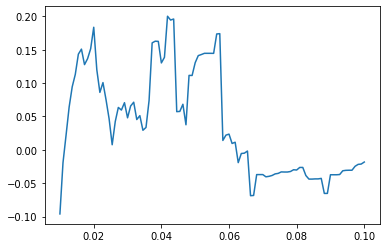

In [ ]:
plt.plot(eps_grid, silh_list)

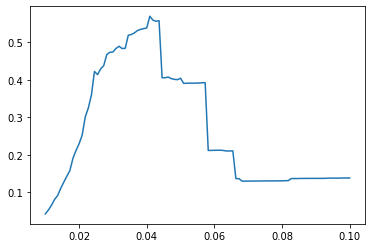

In [ ]:
plt.plot(eps_grid, ari_list)

In [ ]:
eps_grid[np.argmax(ari_list)]

0.040909090909090916

In [ ]:
eps_grid[np.argmax(silh_list)]

0.041818181818181824

In [ ]:
eps = eps_grid[np.argmax(ari_list)]

In [ ]:
outlier_color = colors[-1  % len(colors)]
outlier_color

'lightgray'

In [ ]:
dbscan = DBSCAN(eps=e, min_samples=min_samp)
dbscan.fit(quake_coord)


colors = ["red", "blue", "green", "purple", "orange", "darkred",
          "lightred", "beige", "darkblue", "darkgreen", "cadetblue", "darkpurple", 
          "white", "pink", "lightblue", "lightgreen", "gray", "black", "lightgray"]

m = folium.Map(location=[0, 0], zoom_start=1, disable_3d=True, prefer_canvas=True)
"""clusterMarkers = []
for i in range(K):
    clusterMarkers.append(MarkerCluster().add_to(m))"""
for i, row in quake.iterrows():
    if row['Longitude'] > 180:
        coords = [row['Latitude'], row['Longitude']-360]
    else:
        coords = [row['Latitude'], row['Longitude']]
    cluster_id = dbscan.labels_[i]
    folium.Marker(location=coords, icon=folium.Icon(color=colors[cluster_id% len(colors)])).add_to(m)

m

DBSCAN has a problem with clusters of varying density - this is our case, so the majority of points were labeled as outliers. So further tuning of hyperparams can slightly improve the situation, but not significally.

In [ ]:
from sklearn.cluster import AgglomerativeClustering

In [ ]:
ari_ac = []
for K in range(2, 25):
    hierarchy = AgglomerativeClustering(n_clusters=K, affinity='euclidean', linkage='complete')
    hierarchy.fit(quake_coord)
    ari_ac.append(adjusted_rand_score(silhouette_clusters, hierarchy.labels_))
    print("Clusters:", K, "linkage:", 'complete', ". Score:", silhouette_score(quake_coord, hierarchy.labels_))
    print(f"ARI with Kmeans = {adjusted_rand_score(silhouette_clusters, hierarchy.labels_)}")

Clusters: 2 linkage: complete . Score: 0.4562526045634778
ARI with Kmeans = 0.0826053190674652
Clusters: 3 linkage: complete . Score: 0.4200151813254977
ARI with Kmeans = 0.08972493962461575
Clusters: 4 linkage: complete . Score: 0.3961656463872163
ARI with Kmeans = 0.0913488846834694
Clusters: 5 linkage: complete . Score: 0.3281867457410283
ARI with Kmeans = 0.13834514760402997
Clusters: 6 linkage: complete . Score: 0.3016420203131718
ARI with Kmeans = 0.13837198811355683
Clusters: 7 linkage: complete . Score: 0.3761167945512704
ARI with Kmeans = 0.2964707208384245
Clusters: 8 linkage: complete . Score: 0.3574469013319013
ARI with Kmeans = 0.2985437345920121
Clusters: 9 linkage: complete . Score: 0.36063683031579
ARI with Kmeans = 0.29917345758973085
Clusters: 10 linkage: complete . Score: 0.4212301403080574
ARI with Kmeans = 0.43066570971219104
Clusters: 11 linkage: complete . Score: 0.4345451865623129
ARI with Kmeans = 0.44623001227892095
Clusters: 12 linkage: complete . Score: 0.42

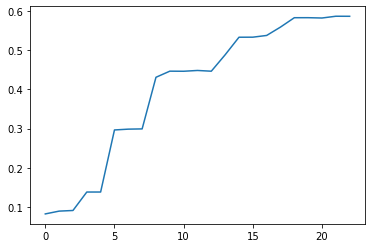

In [ ]:
plt.plot(ari_ac)

In [ ]:
opt_k = range(2, 25)[np.argmax(ari_ac)]

In [ ]:
hierarchy = AgglomerativeClustering(n_clusters=opt_k, affinity='euclidean', linkage='complete')
hierarchy.fit(quake_coord)

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
                        connectivity=None, distance_threshold=None,
                        linkage='complete', memory=None, n_clusters=23)

In [ ]:



colors = ["red", "blue", "green", "purple", "orange", "darkred",
          "lightred", "beige", "darkblue", "darkgreen", "cadetblue", "darkpurple", 
          "white", "pink", "lightblue", "lightgreen", "gray", "black", "lightgray"]

m = folium.Map(location=[0, 0], zoom_start=1, disable_3d=True, prefer_canvas=True)
"""clusterMarkers = []
for i in range(K):
    clusterMarkers.append(MarkerCluster().add_to(m))"""
for i, row in quake.iterrows():
    if row['Longitude'] > 180:
        coords = [row['Latitude'], row['Longitude']-360]
    else:
        coords = [row['Latitude'], row['Longitude']]
    cluster_id = hierarchy.labels_[i]
    folium.Marker(location=coords, icon=folium.Icon(color=colors[cluster_id % len(colors)])).add_to(m)

m

Here we can play with linkage, and affinity parameters. We can also increase grid and maybe search more optimal number of clusters, but we know number of clusters in KMeans, so metric can be misleading.


Aglomerative clustering seems the most interpretable model, it can both fit complex shape of clusters and some structure in locations of quakes. We can see some geographic structure without obvious contradictions.

This analysis was performed only on coordinates, if we use "Focal depth" and "Richter score"  the pipeline a bit changes in tuning hyperparams, so we must change grids and we could get other optimal params. For this case we must change analysis of results and conclusions, somewhere there must be clusters of quakes with different depth and streghth. Also we may have to decrease scale of this features to prevent merging clusters from different areas and close depths.


